# Wheat Detection
## Exploratory Data Analysis

### Introduction
Detection of wheat spikes with computer vision opens a lot of opportunity for the farmers and breeders like:

controlling the growth stage of the plants on the field: 
* the number oand the area of spikes is raising closer to the harvest date;
* controlling the heatlth of the plants: 
* unusually small number or small size of plants might be a signal of deceased plants;
* spikes density characteristic and approximate yield estimation for different varieties of wheat.


In this notebook I am exploring the data and giving some thoughts on what to pay attention when making and validating the models.

### Contents:
<li>Importing and processing image data</li>
<li>Plotting a sample of train images</li>
<li>Plotting a sample of image with bounding box</li>
<li>CSV-file overview and main statistics</li>
<li>Spikes quantitie per image distribution</li>
<li>Spikes area per image distribution</li>
<li>The brightness of the images</li>
<li>Conclusion

The list of required python libraries for this notebook:

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import random
import os
from tqdm.auto import tqdm
import matplotlib.patches as patches
import cv2

In [2]:
train_dir = 'input/train/images/train'
file_names = os.listdir(train_dir)

This dataset contains 3422 of labeled of wheat spikes images in train data set which I going to split on:
* 2000 - training set;
* 422 - validation set;
* 1000 - testing set;
The images were acquired under a variety of conditions and vary in the spike size, location and imaging modality (brightfield vs. fluorescence). The dataset is designed to challenge an algorithm's ability to generalize across these variations.

Each image is represented by an associated ImageId. Files belonging to an image are contained in a folder with this ImageId. Within this folder are two subfolders with label-files(.txt) and image-files itselves (.jpg):

* input/train/images
* input/train/labels

Besides this I have CSV-file (train.csv) with all bounded boxes information (location and size)

The quantity of images (analyzing the files):

In [3]:
val_dir = 'input/train/images/valid'
file_names = os.listdir(val_dir)
print(len(file_names))
train_dir = 'input/train/images/train'
file_names = os.listdir(train_dir)
print(len(file_names))

422
3000


Check the unique sizes of the dataset (analyzing the files):

In [4]:
sizes = []
for n, fl_name in tqdm(enumerate(file_names), total=len(file_names)):
    file_path = os.path.join(train_dir, fl_name)
    img = plt.imread(file_path)
    sizes.append((img.shape[0],img.shape[1])) 
print(len(sizes))
print(np.unique(sizes))


3000
[1024]


Let's take a look at some random pictures:

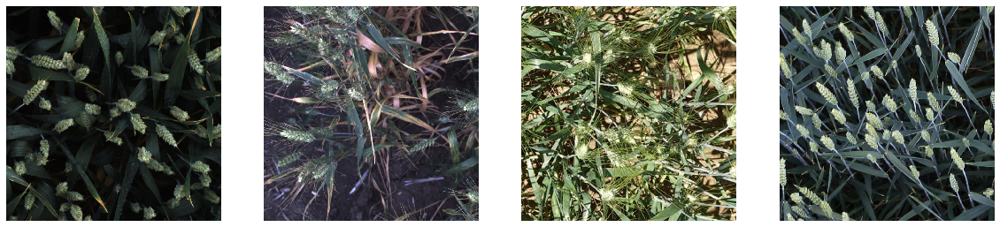

In [5]:
%matplotlib inline
n_samples = 4
demo_imgs = random.sample(file_names, n_samples)
fig, ax = plt.subplots(1,n_samples, figsize=(20,10))
for n, fl_name in enumerate(demo_imgs):
    file_path = os.path.join(train_dir, fl_name)
    img = plt.imread(file_path)
    ax[n].imshow(img)
    ax[n].axis('off')

And with bounding boxes:

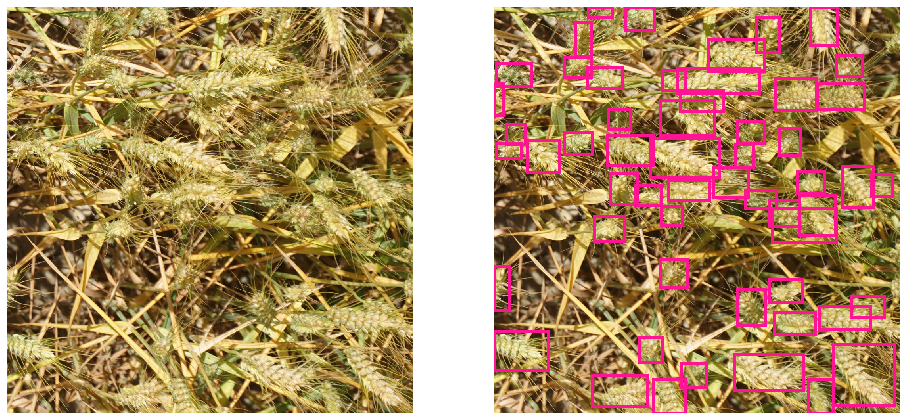

In [6]:
%matplotlib inline
df = pd.read_csv('input/train.csv')
img_file = file_names[0]
fig, ax = plt.subplots(1,2, figsize=(16,8))
file_path = os.path.join(train_dir, img_file)
img = plt.imread(file_path)
ax[0].imshow(img)
ax[0].axis('off')
ax[1].imshow(img)
ax[1].axis('off')
img_name = img_file[:-4]
arr_boxes = np.array(df[df['image_id']==img_name]['bbox'])
boxes = []
for i in df[df['image_id']==img_name]['bbox']:
    i = i.replace(',', '')
    i = i.replace('[', '')
    i = i.replace(']', '')
    boxes.append(i.split())
for i in boxes:
    rect = patches.Rectangle((int(i[0]),int(i[1])),int(i[2]),int(i[3]),linewidth=3,edgecolor='deeppink',facecolor='none')
    ax[1].add_patch(rect)

A quick look at the CSV-file:

In [7]:
df = pd.read_csv('input/train.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   image_id  147793 non-null  object
 1   width     147793 non-null  int64 
 2   height    147793 non-null  int64 
 3   bbox      147793 non-null  object
 4   source    147793 non-null  object
dtypes: int64(2), object(3)
memory usage: 5.6+ MB


And some manipulations with format of bounding boxes. Let's split each value to the separate column:

In [8]:
repl=[]
for i in range(len(df)):
    row = df.iloc[i,3]
    row = row.replace(',', '')
    row = row.replace('[', '')
    row = row.replace(']', '')
    row= row.split()
    row = [round(float(i)) for i in row]
    repl.append(row)
arr = np.array(repl)
df['box_x'] = arr[:,0]
df['box_y'] = arr[:,1]
df['box_w'] = arr[:,2]
df['box_h'] = arr[:,3]
df

,image_id,width,height,bbox,source,box_x,box_y,box_w,box_h
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,834,222,56,36
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,226,548,130,58
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,377,504,74,160
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,834,95,109,107
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,26,144,124,117
...,...,...,...,...,...,...,...,...,...
147788,5e0747034,1024,1024,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64,619,84,95
147789,5e0747034,1024,1024,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292,549,107,82
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134,228,141,71
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430,13,184,79


And additional column for 'box Area' values

In [9]:
df['Area'] = df.box_w * df.box_h
df

,image_id,width,height,bbox,source,box_x,box_y,box_w,box_h,Area
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,834,222,56,36,2016
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,226,548,130,58,7540
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,377,504,74,160,11840
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,834,95,109,107,11663
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,26,144,124,117,14508
...,...,...,...,...,...,...,...,...,...,...
147788,5e0747034,1024,1024,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64,619,84,95,7980
147789,5e0747034,1024,1024,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292,549,107,82,8774
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134,228,141,71,10011
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430,13,184,79,14536


So, now my DataFrame contains:
* image_id - each image ident number, the name of file is the same
*  width & height of images. All of them have the size 1024x1024
* bbox	- boundinb boxes characteristics (coordinates and size) 
* source - the lication where images where taken
* (box_x	box_y	box_w	box_h	Area) - splitted bounding boxes characteristics (coordinates and size) per column 


and now we are ready to dive deeper into the statistics...

## STATISTICS

Function for image-set plotting:

In [10]:
def plot_8(lst):
    fig, ax = plt.subplots(2,4, figsize=(20,10))
    for n, fl_name in enumerate(lst[:4]):
        train_dir = 'input/train/images/train'
        val_dir = 'input/train/images/valid'
    
        try:
            file_path = os.path.join(train_dir, fl_name+'.jpg')
            img = plt.imread(file_path)
        except:
            file_path = os.path.join(val_dir, fl_name+'.jpg')
            img = plt.imread(file_path)
        ax[0, n].imshow(img)
        ax[0, n].axis('off')
        boxes = []        
        for index, i in df[df['image_id']==fl_name].iterrows():
            rect = patches.Rectangle((i.box_x, i.box_y), i.box_w, i.box_h, linewidth=3,edgecolor='deeppink',facecolor='none')
            ax[0, n].add_patch(rect)
    for n, fl_name in enumerate(lst[-4:]):
        try:
            file_path = os.path.join(train_dir, fl_name+'.jpg')
            img = plt.imread(file_path)
        except:
            file_path = os.path.join(val_dir, fl_name+'.jpg')
            img = plt.imread(file_path)
        ax[1, n].imshow(img)
        ax[1, n].axis('off')
        for index, i in df[df['image_id']==fl_name].iterrows():
            rect = patches.Rectangle((i.box_x, i.box_y), i.box_w, i.box_h, linewidth=3,edgecolor='deeppink',facecolor='none')
            ax[1, n].add_patch(rect)

### Count number of bounding box quantities per image

Quantity of empty images, with no spikes and labeled bounding boxes

In [11]:
no_box_names = np.setdiff1d(np.array(file_names), np.array(df.image_id+'.jpg'))
print(random.sample(list(no_box_names),8))
len(no_box_names)

['581eaf87b.jpg', '9e21e7969.jpg', '45fddc611.jpg', '526d737d1.jpg', '155c440e8.jpg', 'cfc9040ca.jpg', '39a0e5556.jpg', '0cf7ef43d.jpg']


42

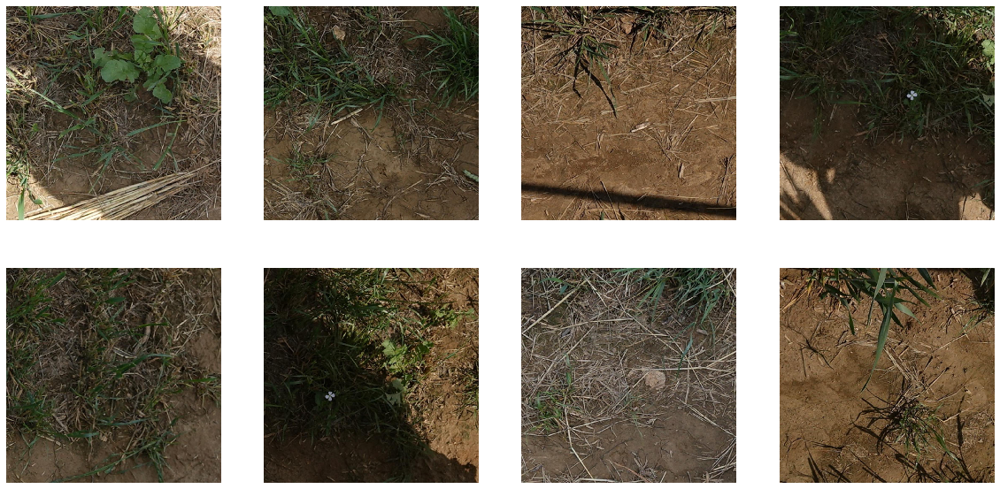

In [12]:
fig, ax = plt.subplots(2,4, figsize=(20,10))
for n, fl_name in enumerate(no_box_names[:4]):
    file_path = os.path.join(train_dir, fl_name)
    img = plt.imread(file_path)
    ax[0, n].imshow(img)
    ax[0, n].axis('off')
for n, fl_name in enumerate(no_box_names[-4:]):
    file_path = os.path.join(train_dir, fl_name)
    img = plt.imread(file_path)
    ax[1, n].imshow(img)
    ax[1, n].axis('off')

In [13]:
series=df.groupby('image_id').count()['Area']

Images distribution  per box area

(array([ 22.,  24.,  18.,  44.,  43.,  72.,  98.,  87., 105., 119., 161.,
         82., 117., 170., 129., 110., 161., 111., 103., 113., 157., 105.,
        107., 152., 102.,  86., 142.,  89.,  63.,  68.,  88.,  55.,  54.,
         68.,  34.,  38.,  26.,  15.,  13.,   5.,   8.,   5.,   0.,   1.,
          1.,   0.,   1.,   0.,   0.,   1.]),
 array([  1. ,   3.3,   5.6,   7.9,  10.2,  12.5,  14.8,  17.1,  19.4,
         21.7,  24. ,  26.3,  28.6,  30.9,  33.2,  35.5,  37.8,  40.1,
         42.4,  44.7,  47. ,  49.3,  51.6,  53.9,  56.2,  58.5,  60.8,
         63.1,  65.4,  67.7,  70. ,  72.3,  74.6,  76.9,  79.2,  81.5,
         83.8,  86.1,  88.4,  90.7,  93. ,  95.3,  97.6,  99.9, 102.2,
        104.5, 106.8, 109.1, 111.4, 113.7, 116. ]),
 <a list of 50 Patch objects>)

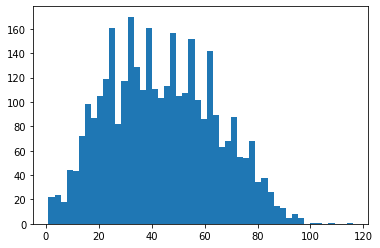

In [14]:
%matplotlib inline
plt.hist(series, bins=50)

Small box quantity per image:
Some samples with box quantity per image less than 3

In [15]:
less_5 = series[series<3]
ch_ls= random.sample(list(less_5.index),8)
print(ch_ls)
len(less_5)

['5d41661cc', '41457a646', '47a1184e4', 'a5cb30c38', '86296fc32', 'b44b1faa9', '14716eed5', '76595919e']


15

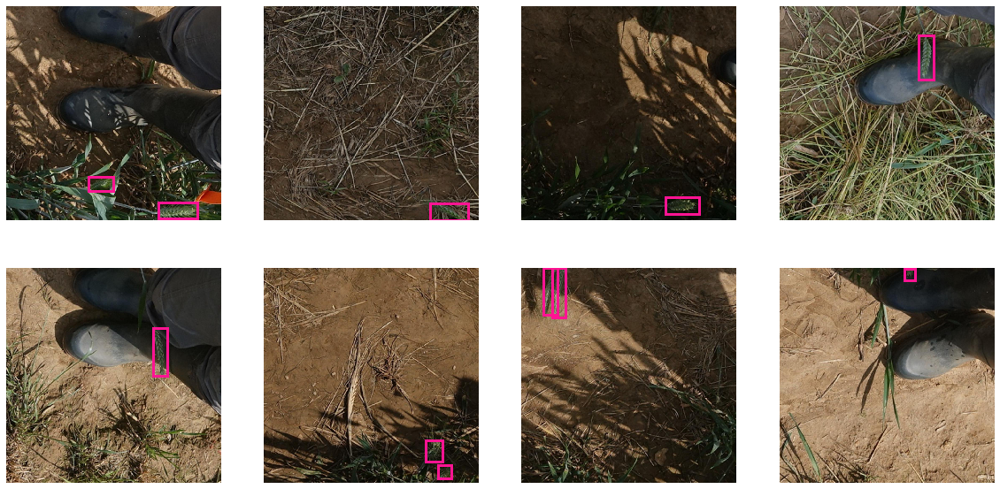

In [16]:
plot_8(ch_ls)

Large box quantity per image:
Some samples with box quantity per image more than 90

['f1794c924', '134d4a01c', '46e480374', 'c968cffa4', '690c7d8f0', 'b70c20580', 'b79a35c8d', 'a119a31fb']


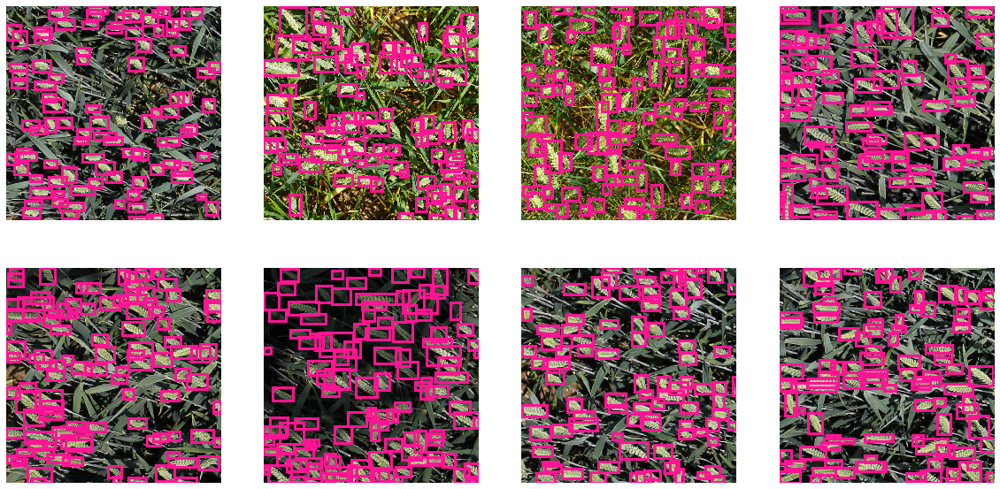

In [17]:
more_90 = series[series>90]
print(random.sample(list(more_90.index),8))
len(more_90)
ch_ls=random.sample(list(more_90.index),8)
plot_8(ch_ls)

### Bounding box area size per image. 

Max images box areas (destribution):

(array([9.750e+02, 1.519e+03, 5.410e+02, 1.880e+02, 6.700e+01, 2.800e+01,
        1.800e+01, 1.200e+01, 3.000e+00, 4.000e+00, 2.000e+00, 4.000e+00,
        1.000e+00, 3.000e+00, 2.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([  2958. ,  13494.6,  24031.2,  34567.8,  45104.4,  55641. ,
         66177.6,  76714.2,  87250.8,  97787.4, 108324. , 118860.6,
        129397.2, 139933.8, 150470.4, 161007. , 171543.6, 182080.2,
        192616.8, 203153.4, 213690. , 224226.6, 234763.2, 245299.8,
        255836.4, 266373. , 276909.6, 287446.2, 297982.8, 308519.4,
        319056. , 329592.6, 340129.2

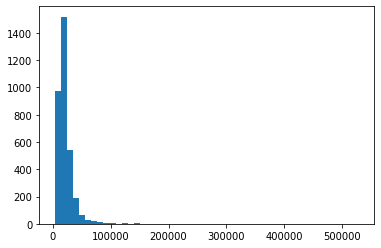

In [18]:
%matplotlib inline
series=df.groupby('image_id').max()['Area']
plt.hist(series, bins=50)

In [19]:
series.sort_values()

image_id
76595919e      2958
df7596db7      5184
701c2e3e9      5198
97851b9c6      5236
708553a80      5243
              ...  
409a8490c    222300
2cc75e9f5    251685
a1321ca95    343416
d067ac2b1    405880
42e6efaaa    529788
Name: Area, Length: 3373, dtype: int32

Pictures with the smallest areas:

['fe3d17ee2', '060740e25', '7939edac8', '483fac02a', '035bdc07a', 'de544d27c', '22f341965', '2cb361be8']


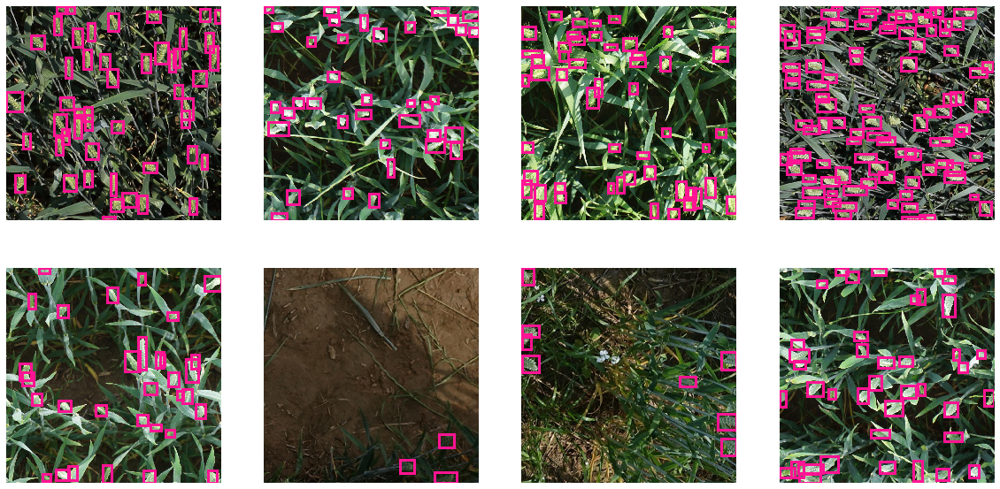

In [20]:
less_7k = series[series<7000]
print(random.sample(list(less_7k.index),8))
len(less_7k)
ch_ls=random.sample(list(less_7k.index),8)
plot_8(ch_ls)

Pictures with the largest areas:

['409a8490c', '7fc9fe138', '51f2e0a05', 'fec6edf64', '42e6efaaa', 'a1321ca95', '2cc75e9f5', 'b2efe29e7']


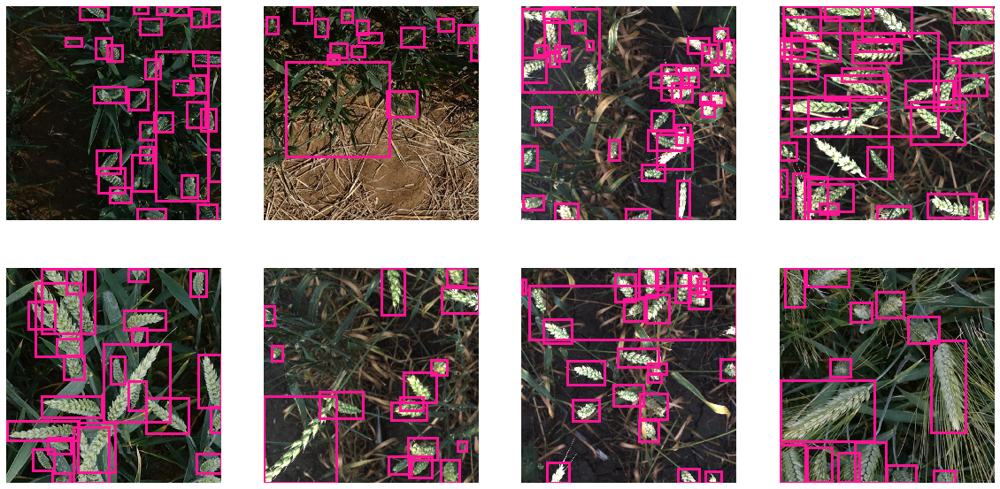

In [21]:
more_100k = series[series>100000]
print(random.sample(list(more_100k.index),8))
len(more_100k)
ch_ls=random.sample(list(more_100k.index),8)
plot_8(ch_ls)

### Images with min box areas (distribution):

(array([198., 417., 596., 444., 347., 339., 283., 196., 135.,  87.,  84.,
         61.,  50.,  40.,  25.,  15.,  11.,   9.,   5.,   4.,   3.,   4.,
          3.,   3.,   3.,   0.,   0.,   0.,   1.,   0.,   4.,   0.,   0.,
          1.,   2.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,
          0.,   0.,   0.,   0.,   0.,   1.]),
 array([2.000000e+00, 4.236400e+02, 8.452800e+02, 1.266920e+03,
        1.688560e+03, 2.110200e+03, 2.531840e+03, 2.953480e+03,
        3.375120e+03, 3.796760e+03, 4.218400e+03, 4.640040e+03,
        5.061680e+03, 5.483320e+03, 5.904960e+03, 6.326600e+03,
        6.748240e+03, 7.169880e+03, 7.591520e+03, 8.013160e+03,
        8.434800e+03, 8.856440e+03, 9.278080e+03, 9.699720e+03,
        1.012136e+04, 1.054300e+04, 1.096464e+04, 1.138628e+04,
        1.180792e+04, 1.222956e+04, 1.265120e+04, 1.307284e+04,
        1.349448e+04, 1.391612e+04, 1.433776e+04, 1.475940e+04,
        1.518104e+04, 1.560268e+04, 1.602432e+04, 1.644596e+04,
        1.686760e+

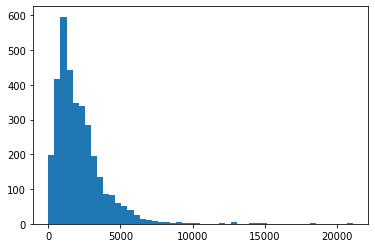

In [22]:
%matplotlib inline
series=df.groupby('image_id').min()['Area']
plt.hist(series, bins=50)

In [23]:
series.sort_values()

image_id
d0912a485        2
809d816dd        6
229716799        8
bf2027ed3        8
666e0a853       12
             ...  
86296fc32    14592
a5cb30c38    14630
41457a646    14823
ce4124be0    18189
b1356efe7    21084
Name: Area, Length: 3373, dtype: int32

['229716799', '6a8522f06', 'f24698e88', 'ca5e51e59', '4ffeedce2', '088d3df51', '666e0a853', 'ad256655b']


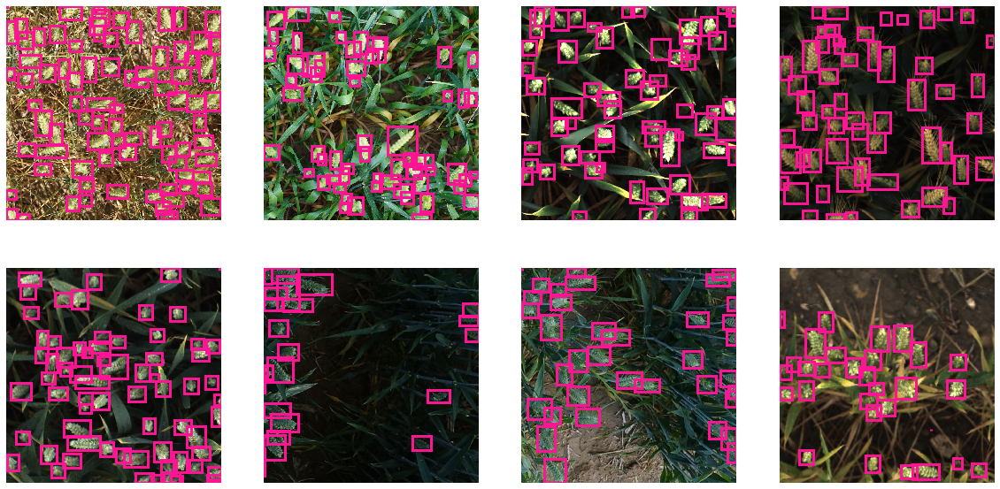

In [24]:
less_100 = series[series<100]
print(random.sample(list(less_100.index),8))
len(less_100)
ch_ls=random.sample(list(less_100.index),8)
plot_8(ch_ls)

['d484ee6d8', '14716eed5', '47a1184e4', '22eabfde5', 'd950bfe39', '3b70da460', '91b435dbb', 'b1356efe7']


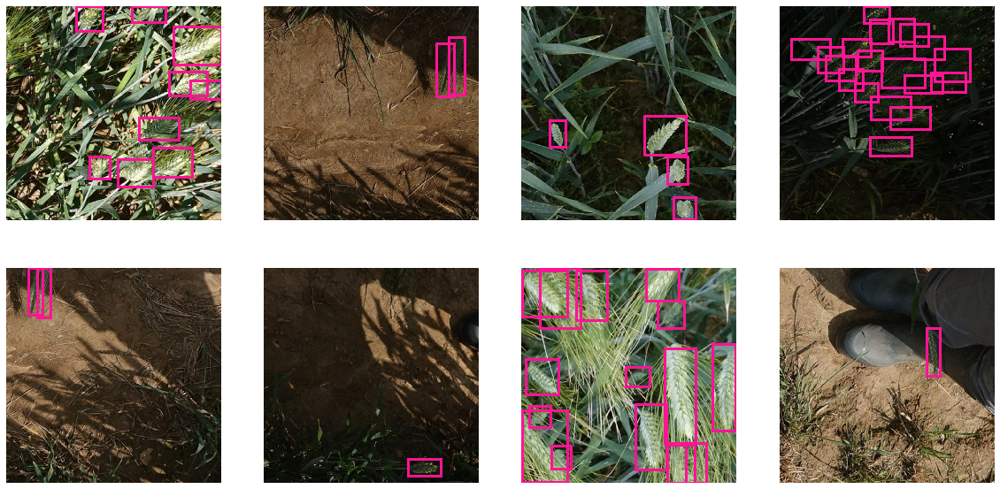

In [25]:
more_9k = series[series>9000]
print(random.sample(list(more_9k.index),8))
len(more_9k)
ch_ls=random.sample(list(more_9k.index),8)
plot_8(ch_ls)

### Total box area per image (distribution):

(array([ 21.,  31.,  31.,  41.,  61.,  73., 100., 140., 162., 225., 244.,
        302., 307., 309., 284., 225., 185., 156., 107.,  88.,  61.,  50.,
         28.,  22.,  26.,  17.,  11.,  19.,  10.,   3.,   1.,   3.,   7.,
          3.,   8.,   2.,   6.,   0.,   0.,   1.,   0.,   1.,   0.,   0.,
          0.,   0.,   0.,   0.,   1.,   1.]),
 array([   2958.  ,   25589.46,   48220.92,   70852.38,   93483.84,
         116115.3 ,  138746.76,  161378.22,  184009.68,  206641.14,
         229272.6 ,  251904.06,  274535.52,  297166.98,  319798.44,
         342429.9 ,  365061.36,  387692.82,  410324.28,  432955.74,
         455587.2 ,  478218.66,  500850.12,  523481.58,  546113.04,
         568744.5 ,  591375.96,  614007.42,  636638.88,  659270.34,
         681901.8 ,  704533.26,  727164.72,  749796.18,  772427.64,
         795059.1 ,  817690.56,  840322.02,  862953.48,  885584.94,
         908216.4 ,  930847.86,  953479.32,  976110.78,  998742.24,
        1021373.7 , 1044005.16, 1066636.62, 10

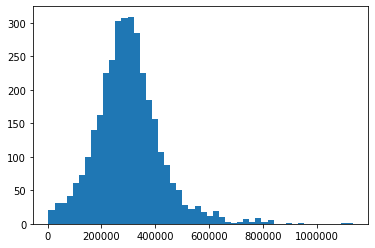

In [26]:
%matplotlib inline
series=df.groupby('image_id').sum()['Area']
plt.hist(series, bins=50)

In [27]:
series.sort_values()

image_id
76595919e       2958
6a62af644       5896
22f341965       6241
4e6c05213       6254
79c8a1627       6270
              ...   
f415daf80     836786
4be2817ef     896432
773bf9022     933806
a1321ca95    1096653
d8cae4d1b    1134531
Name: Area, Length: 3373, dtype: int32

['ce4124be0', '708553a80', '76595919e', 'de544d27c', '47a1184e4', '6a62af644', '86296fc32', '4e6c05213']


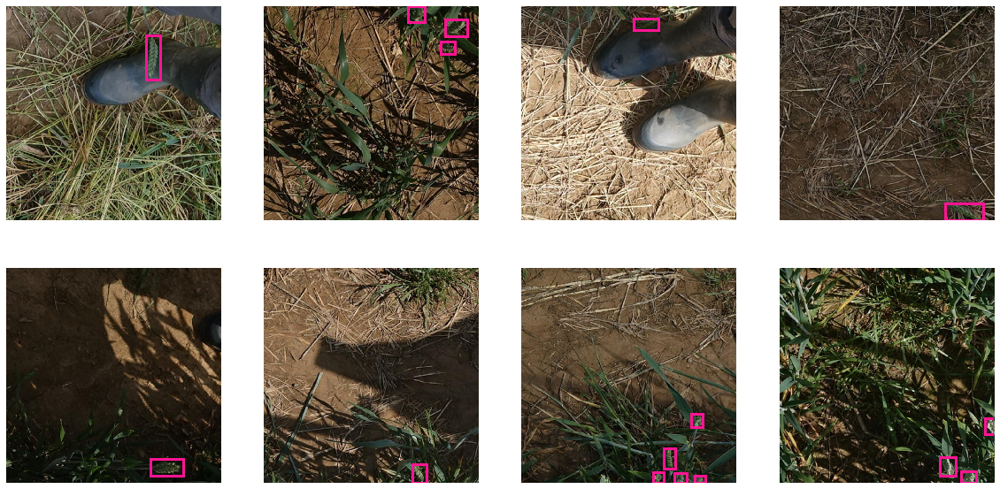

In [28]:
less_19k = series[series<19000]
print(random.sample(list(less_19k.index),8))
len(less_19k)
ch_ls= random.sample(list(less_19k.index),8)
plot_8(ch_ls)

['d067ac2b1', '6df093d5e', '2e0c19135', 'f5f5a9d30', 'ad62f80f2', '2c5b2cd57', 'd4d1c9bc4', '42e6efaaa']


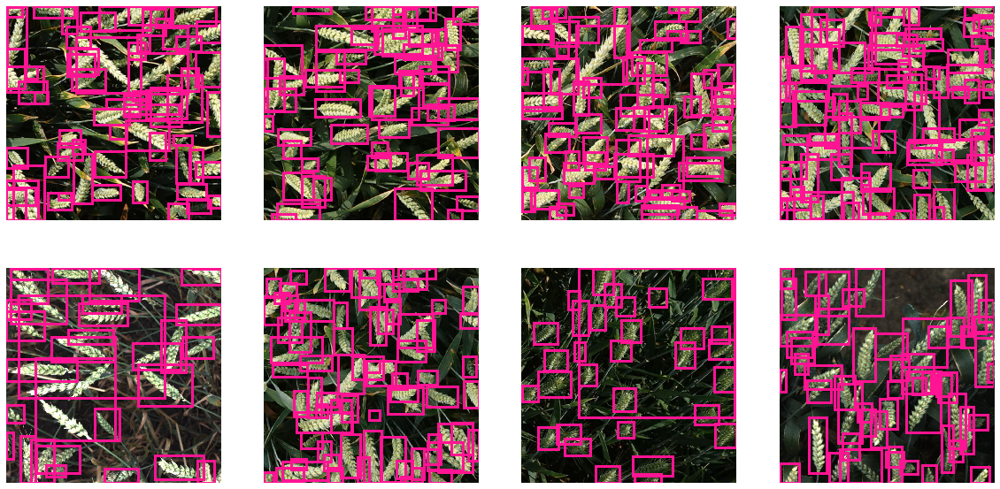

In [29]:
more_79k = series[series>790000]
print(random.sample(list(more_79k.index),8))
len(more_79k)
ch_ls= random.sample(list(more_79k.index),8)
plot_8(ch_ls)

### The brightness of the images

In [30]:

train_dir = 'input/train/images/train'
ls = os.listdir(train_dir)
ls = [x[:-4] for x in ls]
sr_br = pd.Series(np.unique(df.image_id), index=np.unique(df.image_id))
sr_br = sr_br[sr_br.isin(ls)]


print(len(sr_br))
#sr_br = pd.Series(np.unique(df.image_id), index=np.unique(df.image_id))
#for n, fl_name in tqdm(enumerate(np.unique(df.image_id)), total=len(np.unique(df.image_id))):
for n, fl_name in tqdm(enumerate(sr_br), total=len(sr_br)):
    im_arr = cv2.imread(os.path.join(train_dir, fl_name+'.jpg'))
    gray = cv2.cvtColor(np.float32(im_arr), cv2.COLOR_BGR2GRAY)
    sr_br[n]=np.array(gray).mean()

2958


Plot the darkest images:

['0a10cd864', '999645d8a', '51260fee0', '5b36bb79a', '3b70da460', '18f8b24f1', 'ca5e51e59', '2ad7fa68e']


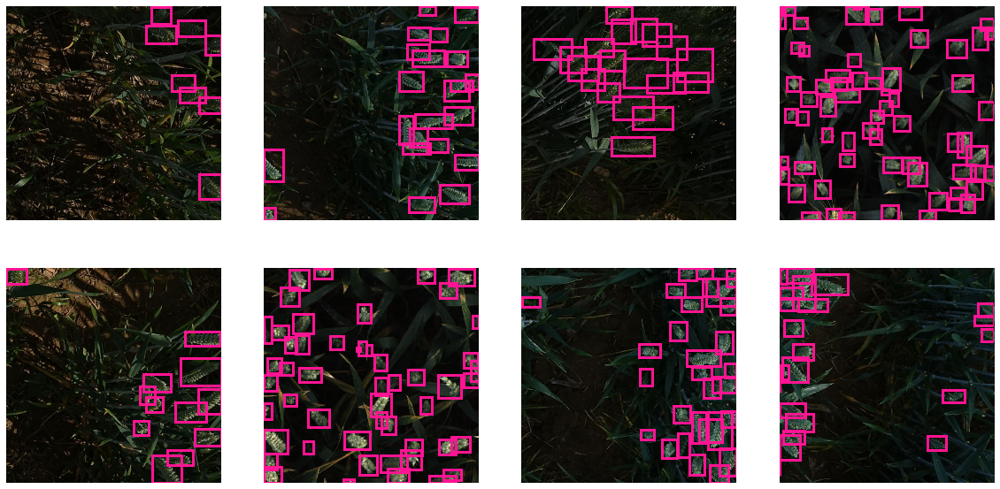

In [31]:
less_26 = sr_br[sr_br<26]
print(random.sample(list(less_26.index),8))
len(less_26)
ch_ls=random.sample(list(less_26.index),8)
plot_8(ch_ls)

Plot the brightest images:

['1478a43f1', '0e0a0483e', '3a4672486', '702385560', '619aff026', 'e3f4e8b6d', 'a8f992d8d', '00333207f']


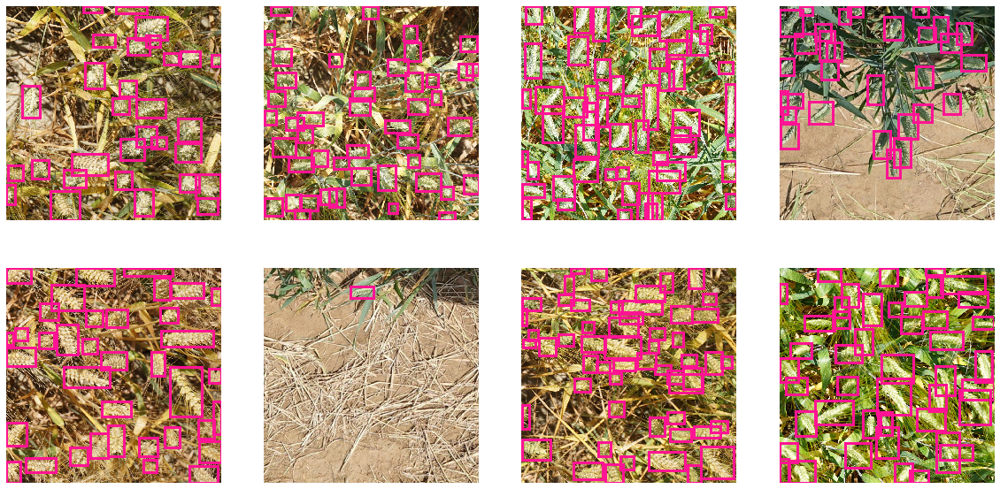

In [32]:
more_128 = sr_br[sr_br>127]
print(random.sample(list(more_128.index),8))
len(more_128)
ch_ls=random.sample(list(more_128.index),8)
plot_8(ch_ls)

**Conclusions:**


Images are taken at different zoom levels. Crop and resize data augmentations to be used for model training.
Images are taken at various lighting conditions. Special filters should be used to address that.
* Bounding boxes are messy!
* Giant bounding boxes should be filtered out by area and removed before model training.
* Micro bounding boxes. These can stay. They won't have much effect on the IOU metric.
* Some spikes are not surrounded by a bounding box (missing bounding boxes).